In [54]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('seaborn-notebook')

In [55]:
airbnb = pd.read_csv('AB_NYC_2019.csv')
airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


## Checking the shape of the dataframe

In [56]:
airbnb.shape

(48895, 16)

### Checking the datatypes of the dataframe

In [57]:
airbnb.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [58]:
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

### Understanding, Wrangling and Cleaning data

In [59]:
# Checking the number of missing values in the dataset for each columns
airbnb.isna().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

From the above information we can see that the data that are missing in columns that are insignificant to our data analysis. Columns such as 'name','host_name' and 'last_review' doesn't signify the price of the listings. So, we will be dropping those columns. 'reviews_per_month' column can be attributed as a calculated field from 'number_of_reviews'. Since, its a calculated field, we can replace the missing values with 0.

In [60]:
airbnb.drop(axis = 1,columns = ['name','host_name','last_review'],inplace = True)

In [61]:
# Assigning zeroes to missing values in 'reviews_per_month'
airbnb['reviews_per_month'].fillna(0,inplace = True)
airbnb.isna().sum()

id                                0
host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

In [62]:
# Checking the shape of dataframe
airbnb.shape

(48895, 13)

Examining the categorical columns in the dataset

In [63]:
# Checking the unique values in the 'neighbourhood_group' column
airbnb['neighbourhood_group'].unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [64]:
# Checking the unique values in the 'neighbourhood' column
airbnb['neighbourhood'].unique()

array(['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem',
       'Murray Hill', 'Bedford-Stuyvesant', "Hell's Kitchen",
       'Upper West Side', 'Chinatown', 'South Slope', 'West Village',
       'Williamsburg', 'Fort Greene', 'Chelsea', 'Crown Heights',
       'Park Slope', 'Windsor Terrace', 'Inwood', 'East Village',
       'Greenpoint', 'Bushwick', 'Flatbush', 'Lower East Side',
       'Prospect-Lefferts Gardens', 'Long Island City', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Prospect Heights',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Gowanus', 'Flatlands', 'Cobble Hill',
       'Flushing', 'Boerum Hill', 'Sunnyside', 'DUMBO', 'St. George',
       'Highbridge', 'Financial District', 'Ridgewood',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Ditmars Steinway', 'Flatiron District', 'Roosevelt Island',
       'Greenwich Village', 'Little Italy', 'East Flatbush',
       'Tompkinsville', 'Asto

In [65]:
# Checking the unique values of 'room_type' column
airbnb['room_type'].unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

### Exploratory Data Analysis
*Exploring the data by analyzing the statistics and visualising the values of features and correlations between different features.*

We will be exploring each and every columns of the dataset. We will be working from left to right, and we will be working on the columns individually.

In [66]:
# Working on 'id' column
# Let's check if there are any duplicates in the column
airbnb[airbnb['id'].duplicated()]

,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365


We can see that there are no duplicated rows in the dataset.

In [67]:
#Working on 'host_id' column
host = airbnb['host_id'].value_counts()[:10]
host

219517861    327
107434423    232
30283594     121
137358866    103
12243051      96
16098958      96
61391963      91
22541573      87
200380610     65
7503643       52
Name: host_id, dtype: int64

[Text(0, 0, '219517861'),
 Text(0, 0, '107434423'),
 Text(0, 0, '30283594'),
 Text(0, 0, '137358866'),
 Text(0, 0, '12243051'),
 Text(0, 0, '16098958'),
 Text(0, 0, '61391963'),
 Text(0, 0, '22541573'),
 Text(0, 0, '200380610'),
 Text(0, 0, '7503643')]

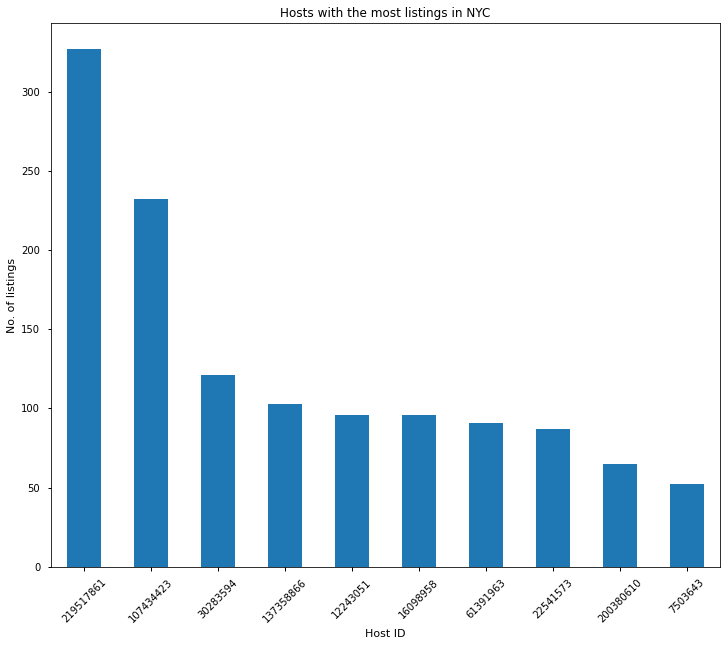

In [68]:
#flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
#sns.set_palette(sns.color_palette(flatui))
_ = plt.figure(figsize=(12,10))
_ = host.plot(kind='bar')
_.set_title('Hosts with the most listings in NYC')
_.set_ylabel('No. of listings')
_.set_xlabel('Host ID')
_.set_xticklabels(_.get_xticklabels(), rotation = 45)

From the above bar plot, we can see that the host which has most listings has over 300+ listings.

In [69]:
# Checking 'neighbourhood_group' column
neighb_group = airbnb['neighbourhood_group'].value_counts()
neighb_group

Manhattan        21661
Brooklyn         20104
Queens            5666
Bronx             1091
Staten Island      373
Name: neighbourhood_group, dtype: int64

[Text(0, 0, 'Manhattan'),
 Text(0, 0, 'Brooklyn'),
 Text(0, 0, 'Queens'),
 Text(0, 0, 'Bronx'),
 Text(0, 0, 'Staten Island')]

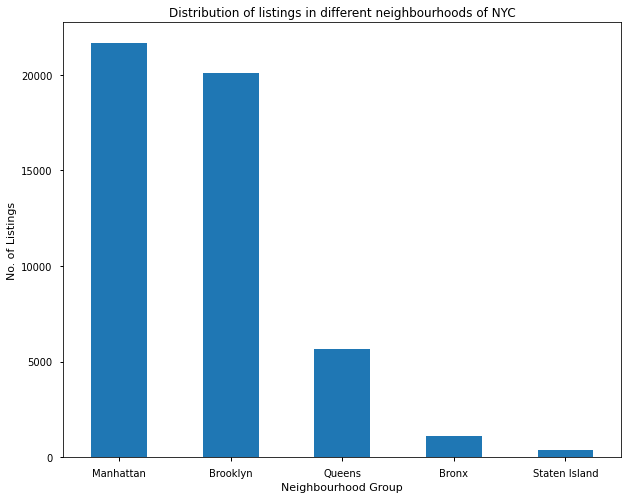

In [70]:
_ = plt.figure(figsize = (10,8))
_ = neighb_group.plot(kind = 'bar')
_.set_title('Distribution of listings in different neighbourhoods of NYC')
_.set_xlabel('Neighbourhood Group')
_.set_ylabel('No. of Listings')
_.set_xticklabels(_.get_xticklabels(), rotation = 0)

From the above bar plot, we can see that Manhattan has the most number of listings. Its interesting to note that two of the neighbourhood groups - Manhattan and Brooklyn has over 20,000 each listings while other neighbourhood groups has no. of listings that are less than 6,000. This attributes to the fact that most of the iconic landmarks and most happening neighbourhoods are Manhattan and Brooklyn.

In [71]:
# Checking the average prices of listings in each neigbourhood groups 
avg_price_grp = airbnb.groupby('neighbourhood_group').agg(np.mean)
avg_price_grp['price']

neighbourhood_group
Bronx             87.496792
Brooklyn         124.383207
Manhattan        196.875814
Queens            99.517649
Staten Island    114.812332
Name: price, dtype: float64

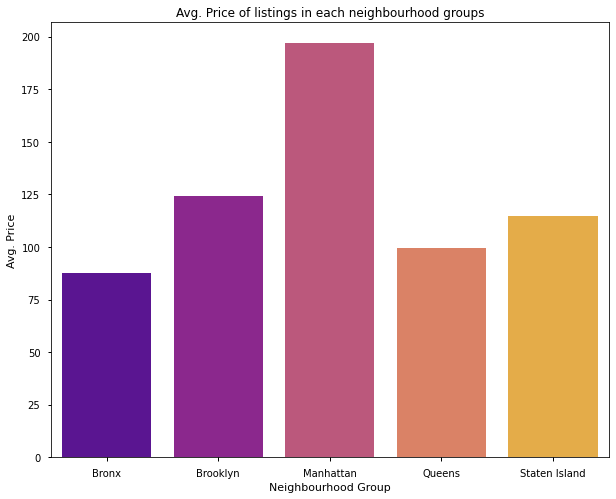

In [72]:
_ = plt.figure(figsize = (10,8))
_ = sns.barplot(x= avg_price_grp.index,y=avg_price_grp['price'], palette = 'plasma')
_.set_title('Avg. Price of listings in each neighbourhood groups')
_.set_xlabel('Neighbourhood Group')
_.set_ylabel('Avg. Price');

In [73]:
#Describing the 'neighbourhood_group" column with prices
avg_price_grp2 = airbnb.groupby('neighbourhood_group')['price']

avg_price_grp2.describe()

,count,mean,std,min,25%,50%,75%,max
neighbourhood_group,,,,,,,,
Bronx,1091.0,87.496792,106.709349,0.0,45.0,65.0,99.0,2500.0
Brooklyn,20104.0,124.383207,186.873538,0.0,60.0,90.0,150.0,10000.0
Manhattan,21661.0,196.875814,291.383183,0.0,95.0,150.0,220.0,10000.0
Queens,5666.0,99.517649,167.102155,10.0,50.0,75.0,110.0,10000.0
Staten Island,373.0,114.812332,277.620403,13.0,50.0,75.0,110.0,5000.0


In [74]:
# Plotting the distribution plot of prices of listing in each neighbourhood groups
manh = airbnb[airbnb['neighbourhood_group']=='Manhattan']
brook = airbnb[airbnb['neighbourhood_group']=='Brooklyn']
queens = airbnb[airbnb['neighbourhood_group']=='Queens']
statisl = airbnb[airbnb['neighbourhood_group']=='Staten Island']
bronx = airbnb[airbnb['neighbourhood_group']=='Bronx']
print (manh['room_type'].value_counts())
print (brook['room_type'].value_counts())
print (queens['room_type'].value_counts())
print (statisl['room_type'].value_counts())
print (bronx['room_type'].value_counts())

Entire home/apt    13199
Private room        7982
Shared room          480
Name: room_type, dtype: int64
Private room       10132
Entire home/apt     9559
Shared room          413
Name: room_type, dtype: int64
Private room       3372
Entire home/apt    2096
Shared room         198
Name: room_type, dtype: int64
Private room       188
Entire home/apt    176
Shared room          9
Name: room_type, dtype: int64
Private room       652
Entire home/apt    379
Shared room         60
Name: room_type, dtype: int64


<Figure size 720x576 with 0 Axes>

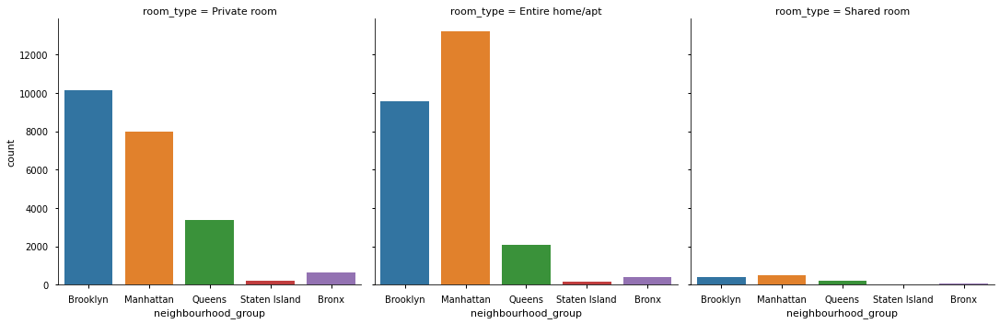

In [75]:
plt.figure(figsize=(10,8));
sns.catplot(x='neighbourhood_group',col = 'room_type',data=airbnb, kind='count'); 

From the above bar plots, we can see that the number of private room listings are greatest in Brooklyn. For room type entire home/apartment listing and shared room, Manhattan has the most number of listings. While the least number of listings are among all the three room types are in Staten Island.

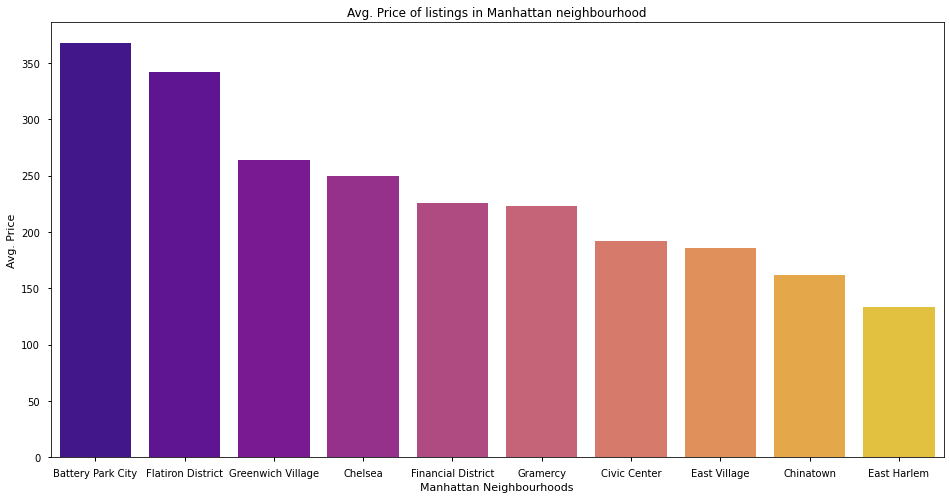

In [76]:
#Neighbourhood columns
#Manhattan
manh_neigh = manh.groupby('neighbourhood').agg(np.mean)[:10].sort_values(by = 'price',ascending = False)
_ = plt.figure(figsize = (16,8))
_ = sns.barplot(x= manh_neigh.index,y=manh_neigh['price'], palette = 'plasma')
_.set_title('Avg. Price of listings in Manhattan neighbourhood')
_.set_xlabel('Manhattan Neighbourhoods')
_.set_ylabel('Avg. Price');

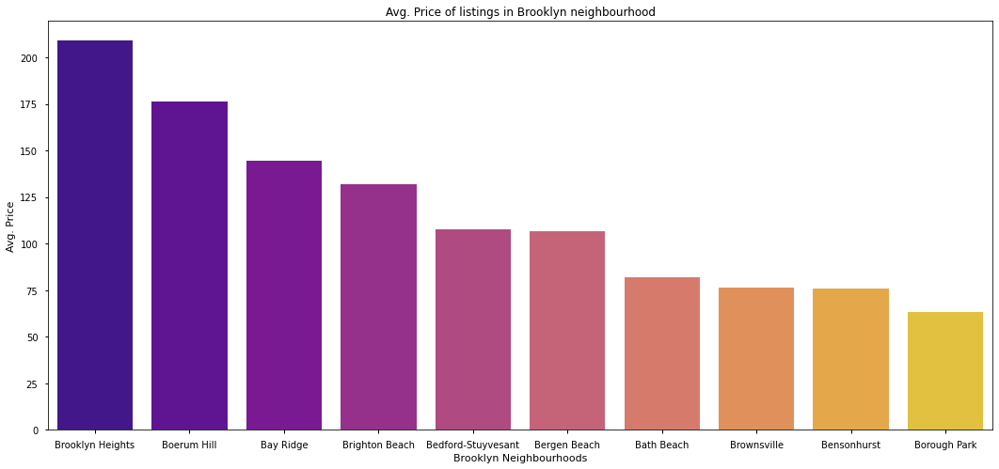

In [77]:
brook_neigh = brook.groupby('neighbourhood').agg(np.mean)[:10].sort_values(by = 'price',ascending = False)
_ = plt.figure(figsize = (18,8))
_ = sns.barplot(x= brook_neigh.index,y=brook_neigh['price'], palette = 'plasma')
_.set_title('Avg. Price of listings in Brooklyn neighbourhood')
_.set_xlabel('Brooklyn Neighbourhoods')
_.set_ylabel('Avg. Price');

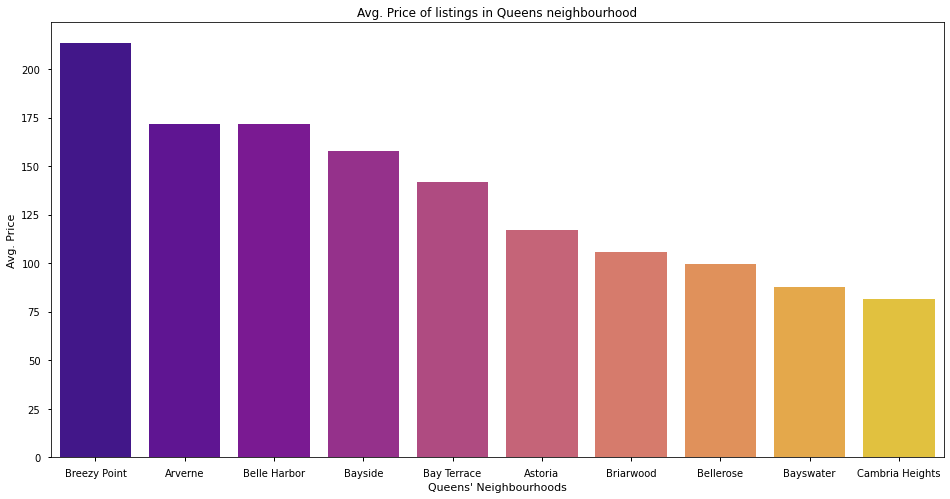

In [78]:
queens_neigh = queens.groupby('neighbourhood').agg(np.mean)[:10].sort_values(by = 'price',ascending = False)
_ = plt.figure(figsize = (16,8))
_ = sns.barplot(x= queens_neigh.index,y=queens_neigh['price'], palette = 'plasma')
_.set_title('Avg. Price of listings in Queens neighbourhood')
_.set_xlabel('Queens\' Neighbourhoods')
_.set_ylabel('Avg. Price');

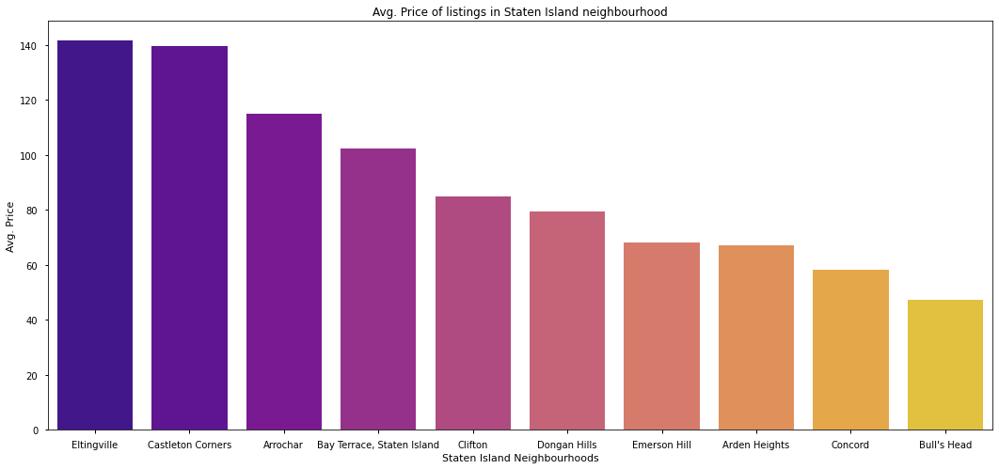

In [79]:
statisl_neigh = statisl.groupby('neighbourhood').agg(np.mean)[:10].sort_values(by = 'price',ascending = False)
_ = plt.figure(figsize = (18,8))
_ = sns.barplot(x= statisl_neigh.index,y=statisl_neigh['price'], palette = 'plasma')
_.set_title('Avg. Price of listings in Staten Island neighbourhood')
_.set_xlabel('Staten Island Neighbourhoods')
_.set_ylabel('Avg. Price');

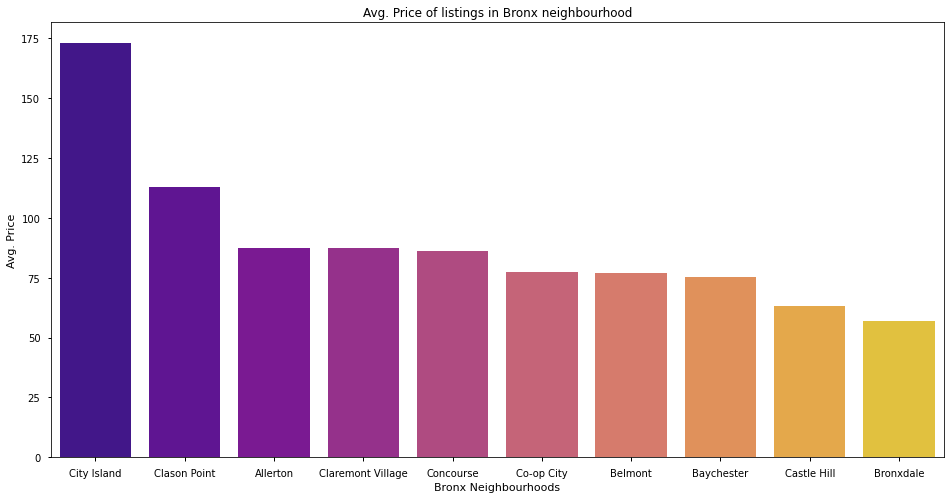

In [80]:
bronx_neigh = bronx.groupby('neighbourhood').agg(np.mean)[:10].sort_values(by = 'price',ascending = False)
_ = plt.figure(figsize = (16,8))
_ = sns.barplot(x= bronx_neigh.index,y=bronx_neigh['price'], palette = 'plasma')
_.set_title('Avg. Price of listings in Bronx neighbourhood')
_.set_xlabel('Bronx Neighbourhoods')
_.set_ylabel('Avg. Price');

In [81]:
## Removing host_id, id, latitude and longitude columns
rem_column = ['id','host_id','latitude','longitude']
airbnb_df = airbnb.copy().drop(rem_column,axis=1)

In [82]:
# Describing the dataframe
airbnb_df.describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,152.720687,7.029962,23.274466,1.090910,7.143982,112.781327
std,240.154170,20.510550,44.550582,1.597283,32.952519,131.622289
min,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,69.000000,1.000000,1.000000,0.040000,1.000000,0.000000
50%,106.000000,3.000000,5.000000,0.370000,1.000000,45.000000
75%,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000
max,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


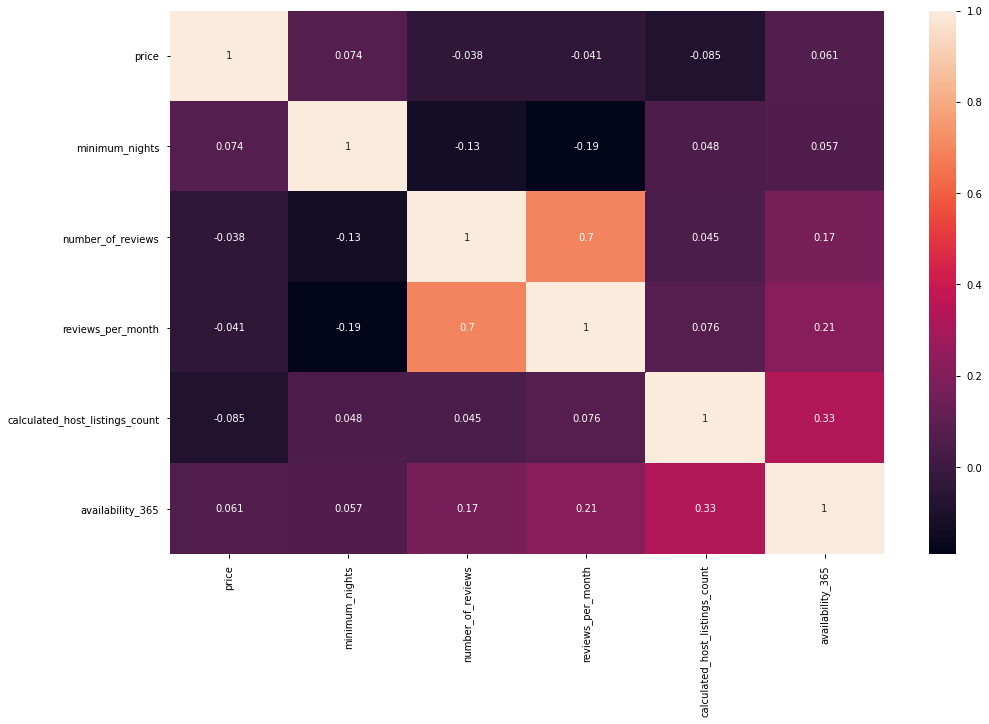

In [83]:
airbnb_corr = airbnb_df.corr(method = 'kendall')
plt.figure(figsize = (16,10))
sns.heatmap(airbnb_corr,annot = True);

In [84]:
config = {
  "version": "v1",
  "config": {
    "visState": {
      "filters": [],
      "layers": [
        {
          "id": "svb5029",
          "type": "point",
          "config": {
            "dataId": "data_1",
            "label": "Point",
            "color": [
              18,
              147,
              154
            ],
            "columns": {
              "lat": "latitude",
              "lng": "longitude",
              "altitude": None
            },
            "isVisible": True,
            "visConfig": {
              "radius": 4.9,
              "fixedRadius": False,
              "opacity": 0.8,
              "outline": False,
              "thickness": 2,
              "strokeColor": None,
              "colorRange": {
                "name": "ColorBrewer Set1-5",
                "type": "qualitative",
                "category": "ColorBrewer",
                "colors": [
                  "#e41a1c",
                  "#377eb8",
                  "#4daf4a",
                  "#984ea3",
                  "#ff7f00"
                ]
              },
              "strokeColorRange": {
                "name": "Global Warming",
                "type": "sequential",
                "category": "Uber",
                "colors": [
                  "#5A1846",
                  "#900C3F",
                  "#C70039",
                  "#E3611C",
                  "#F1920E",
                  "#FFC300"
                ]
              },
              "radiusRange": [
                0,
                50
              ],
              "filled": True
            },
            "hidden": False,
            "textLabel": [
              {
                "field": None,
                "color": [
                  255,
                  255,
                  255
                ],
                "size": 18,
                "offset": [
                  0,
                  0
                ],
                "anchor": "start",
                "alignment": "center"
              }
            ]
          },
          "visualChannels": {
            "colorField": {
              "name": "neighbourhood_group",
              "type": "string"
            },
            "colorScale": "ordinal",
            "strokeColorField": None,
            "strokeColorScale": "quantile",
            "sizeField": None,
            "sizeScale": "linear"
          }
        }
      ],
      "interactionConfig": {
        "tooltip": {
          "fieldsToShow": {
            "data_1": [
              "id",
              "host_id",
              "neighbourhood_group",
              "neighbourhood",
              "room_type"
            ]
          },
          "enabled": True
        },
        "brush": {
          "size": 0.5,
          "enabled": False
        },
        "geocoder": {
          "enabled": False
        },
        "coordinate": {
          "enabled": False
        }
      },
      "layerBlending": "normal",
      "splitMaps": [],
      "animationConfig": {
        "currentTime": None,
        "speed": 1
      }
    },
    "mapState": {
      "bearing": 0,
      "dragRotate": False,
      "latitude": 40.72810948936782,
      "longitude": -73.63147791820853,
      "pitch": 0,
      "zoom": 8.927022615612042,
      "isSplit": False
    },
    "mapStyle": {
      "styleType": "dark",
      "topLayerGroups": {
        "label": True,
        "water": True
      },
      "visibleLayerGroups": {
        "label": True,
        "road": True,
        "border": False,
        "building": True,
        "water": True,
        "land": True,
        "3d building": False
      },
      "threeDBuildingColor": [
        9.665468314072013,
        17.18305478057247,
        31.1442867897876
      ],
      "mapStyles": {}
    }
  }
}

In [85]:
from keplergl import KeplerGl
map1 = KeplerGl(height = 400,data = {'data_1':airbnb},config = config)

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


In [86]:
map1

KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': 'svb5029', 'type': …

In [87]:
airbnb['availability_365'].describe()

count    48895.000000
mean       112.781327
std        131.622289
min          0.000000
25%          0.000000
50%         45.000000
75%        227.000000
max        365.000000
Name: availability_365, dtype: float64

In [88]:
# We will be converting the 'availability_365' column in terms of year
airbnb['availability_365'] = airbnb['availability_365']/365
airbnb['availability_365'].describe()

count    48895.000000
mean         0.308990
std          0.360609
min          0.000000
25%          0.000000
50%          0.123288
75%          0.621918
max          1.000000
Name: availability_365, dtype: float64

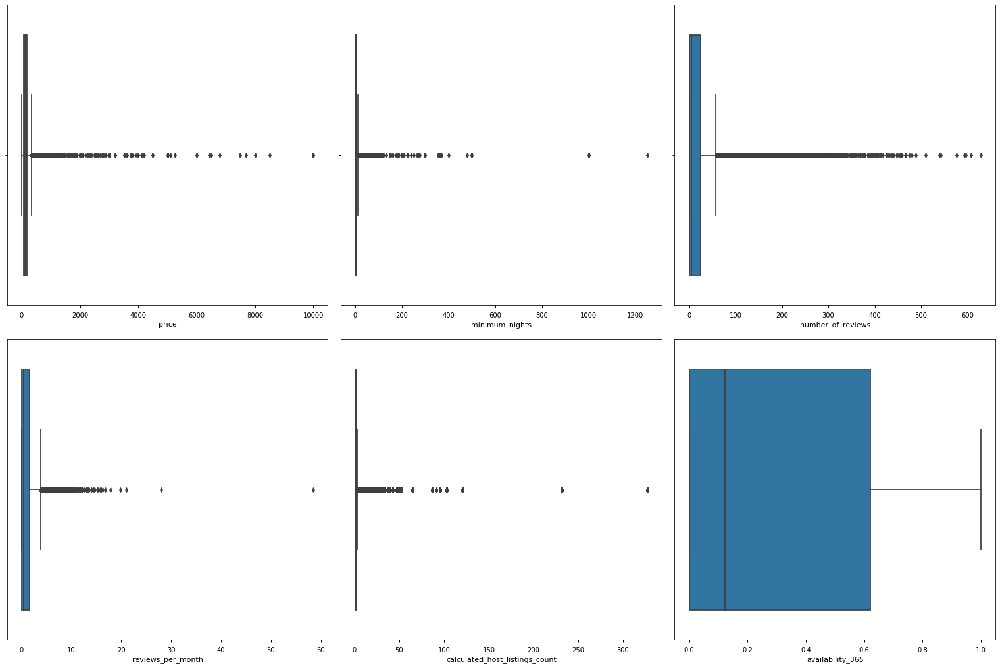

In [89]:
# checking outliers
num_categories = ['price','minimum_nights','number_of_reviews','reviews_per_month',
                  'calculated_host_listings_count','availability_365']
num_plots = len(num_categories)
total_cols = 3
total_rows = len(num_categories)//total_cols 
fig, axs = plt.subplots(nrows= total_rows, ncols = total_cols, 
                        figsize = (7*total_cols, 7*total_rows),constrained_layout = True)
for i, col in enumerate(num_categories):
    row = i//total_cols
    pos = i % total_cols
    plot = sns.boxplot(x=col,data = airbnb,ax = axs[row][pos]);

# Feature Selection

In [90]:
# We will be using Lasso regularisation to rank the feature importance
from sklearn.linear_model import LassoCV, LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler
# Dropping 'neighbourhood' column
airbnb_df.drop(['neighbourhood'],axis=1,inplace=True)
airbnb_df = pd.get_dummies(airbnb_df,drop_first=True)
print(airbnb_df.shape)
airbnb_df.head()

(48895, 12)


,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,room_type_Private room,room_type_Shared room
0,149,1,9,0.21,6,365,1,0,0,0,1,0
1,225,1,45,0.38,2,355,0,1,0,0,0,0
2,150,3,0,0.00,1,365,0,1,0,0,1,0
3,89,1,270,4.64,1,194,1,0,0,0,0,0
4,80,10,9,0.10,1,0,0,1,0,0,0,0


In [91]:
# Standardising the dataframe so as to make the mean = 0 and variance = 1
# Dropping the price column and storing it to target variable
y = np.array(airbnb['price'])
X = airbnb_df.drop('price',axis=1)

In [92]:
# Standardising the X dataframe
scaler = StandardScaler()
cols = X.columns
X = scaler.fit_transform(X)
X = pd.DataFrame(X, columns=cols)
X.head()

,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,room_type_Private room,room_type_Shared room
0,-0.293996,-0.320414,-0.551511,-0.034716,1.916250,1.196705,-0.891833,-0.362035,-0.087677,1.090893,-0.155887
1,-0.293996,0.487665,-0.445079,-0.156104,1.840275,-0.835628,1.121286,-0.362035,-0.087677,-0.916680,-0.155887
2,-0.196484,-0.522433,-0.682986,-0.186451,1.916250,-0.835628,1.121286,-0.362035,-0.087677,1.090893,-0.155887
3,-0.293996,5.538156,2.221978,-0.186451,0.617065,1.196705,-0.891833,-0.362035,-0.087677,-0.916680,-0.155887
4,0.144807,-0.320414,-0.620379,-0.186451,-0.856865,-0.835628,1.121286,-0.362035,-0.087677,-0.916680,-0.155887


In [93]:
# Splitting the dataset into train test
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.25,random_state = 42)
y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

In [94]:
# Finding the importance of each columns using LassoCV()
clf = LassoCV().fit(X_train,y_train)
importance = np.abs(clf.coef_)
for i,k in zip(X_train.columns,importance):
    print (f"{i} : {k}")

minimum_nights : 0.0
number_of_reviews : 10.724478589957927
reviews_per_month : 6.3560168541986615
calculated_host_listings_count : 3.937827723303459
availability_365 : 25.327199158151267
neighbourhood_group_Brooklyn : 13.052748631075804
neighbourhood_group_Manhattan : 41.3928170194255
neighbourhood_group_Queens : 2.5568439512176315
neighbourhood_group_Staten Island : 0.08121281306160945
room_type_Private room : 55.33110520186272
room_type_Shared room : 22.310694132642276


In [95]:
# Select from the model features with the highest score
# SelectfromModel() allows for setting the threshold for seleting features that have more importance. We will be selecting a threshold value of 10.6.
sfm = SelectFromModel(clf,threshold=10.6)
X_train_tranform = sfm.fit_transform(X_train,y_train)
print (f'The no. of features that have been selected is {X_train_tranform.shape[1]}')
X_train_tranform

The no. of features that have been selected is 6


array([[ 4.12401822,  1.45279823,  1.19670509, -0.89183299, -0.91668021,
        -0.15588723],
       [-0.49998658,  1.83267698, -0.83562777, -0.89183299,  1.09089297,
        -0.15588723],
       [-0.14084058, -0.85686461,  1.19670509, -0.89183299, -0.91668021,
        -0.15588723],
       ...,
       [-0.49998658,  1.1261025 , -0.83562777,  1.12128617, -0.91668021,
        -0.15588723],
       [-0.27552033, -0.84166946, -0.83562777,  1.12128617, -0.91668021,
        -0.15588723],
       [-0.49998658, -0.85686461, -0.83562777, -0.89183299, -0.91668021,
        -0.15588723]])

## Model Selection and Evaluation

### Multpile Linear Regression Model

In [96]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error,explained_variance_score
lin_reg = LinearRegression()
lin_reg.fit(X_train_tranform,y_train)
train_pred = lin_reg.predict(X_train_tranform)
X_transform_test = sfm.transform(X_test)
test_predict_linear = lin_reg.predict(X_transform_test)

In [97]:
def r2_mse_rmse(label_y,predict_X,title = '',dataset = ''):
    '''Evaluates the R2 Score, Mean Squared Error and Root Mean Squared Error'''
    print (title)
    print (f"R2 score of the {dataset} dataset: {r2_score(label_y,predict_X)}")
    print (f"MSE score of the {dataset} dataset: {mean_squared_error(label_y,predict_X)}")
    print (f"RMSE score of the {dataset} dataset: {np.sqrt(mean_squared_error(label_y,predict_X))}")
def var_std(test_y,test_pred_y,train_y,train_pred_y,title):
    '''Evaluates the Variance and Standard Deviation of the model'''
    lin_var = abs(mean_squared_error(test_y,test_pred_y)-mean_squared_error(train_y,train_pred_y))
    lin_std = lin_var**0.5
    print (f'Variance of {title}: {lin_var}')
    print (f'Standard Deviation of {title}: {lin_std}')
def plot_prediction_analysis(y, y_pred, title=''):
    fig, axs = plt.subplots(1,2,figsize = (10,4))
    axs[0].scatter(y, y_pred)
    mn = min(np.min(y), np.min(y_pred))
    mx = max(np.max(y), np.max(y_pred))
    axs[0].plot([mn, mx], [mn, mx], c='red')
    axs[0].set_xlabel('$y$')
    axs[0].set_ylabel('$\hat{y}$')
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    evs = explained_variance_score(y, y_pred)
    axs[0].set_title('rmse = {:.2f}, evs = {:.2f}'.format(rmse, evs))
    
    axs[1].hist(y-y_pred, bins=50)
    avg = np.mean(y-y_pred)
    std = np.std(y-y_pred)
    axs[1].set_xlabel('$y - \hat{y}$')
    axs[1].set_title('Histrogram prediction error, $\mu$ = {:.2f}, $\sigma$ = {:.2f}'.format(avg, std))
    
    if title!='':
        fig.suptitle(title)

Metrics for Test Data
R2 score of the Test dataset: 0.12149006125373019
MSE score of the Test dataset: 36620.463456394304
RMSE score of the Test dataset: 191.36473932361287


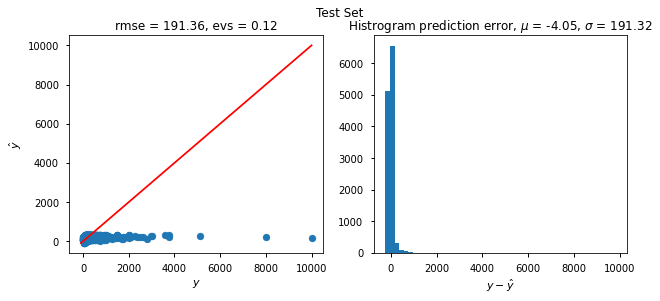

In [98]:
r2_mse_rmse(y_test,test_predict_linear,'Metrics for Test Data','Test')
plot_prediction_analysis(y_test,test_predict_linear,'Test Set')

Metrics for Train Data
R2 score of the Train dataset: 0.0859047976631222
MSE score of the Train dataset: 57584.61749023495
RMSE score of the Train dataset: 239.9679509647798


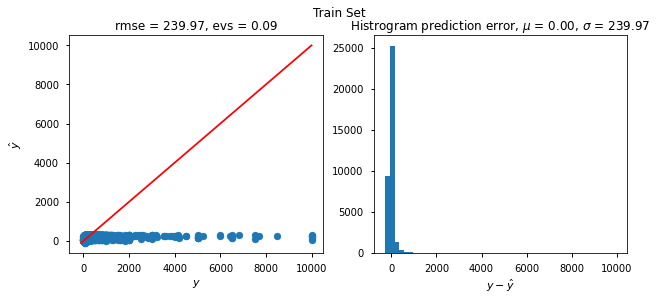

In [99]:
r2_mse_rmse(y_train,train_pred,'Metrics for Train Data','Train')
plot_prediction_analysis(y_train,train_pred,'Train Set')

In [100]:
var_std(y_test,test_predict_linear,y_train,train_pred,'Linear Regression Model')

Variance of Linear Regression Model: 20964.15403384065
Standard Deviation of Linear Regression Model: 144.79003430430095


### Decision Tree Regressor

In [101]:
from sklearn.tree import DecisionTreeRegressor
depth = [1,2,3,4,5,6,7,8,9,10]
dec_score = []
for d in depth:
    dec_regressor = DecisionTreeRegressor(criterion='mse', max_depth=d, random_state=42)
    dec_regressor.fit(X_train_tranform,y_train)
    dec_score.append(dec_regressor.score(X_transform_test,y_test))


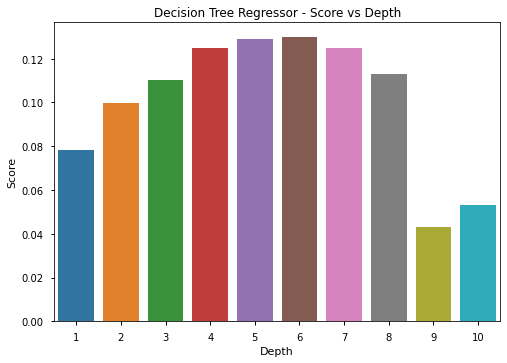

In [102]:
sns.barplot(x = depth,y = dec_score)
plt.title('Decision Tree Regressor - Score vs Depth')
plt.xlabel('Depth')
plt.ylabel('Score');

From the graph, we can see that the score reaches maximum when the depth is at 5. So, optimal max_depth = 6. 

In [103]:
dec_tree = DecisionTreeRegressor(max_depth=6)
dec_tree.fit(X_train_tranform,y_train)

DecisionTreeRegressor(max_depth=6)

In [104]:
train_pred_dec = dec_tree.predict(X_train_tranform)
test_pred_dec = dec_tree.predict(X_transform_test)

In [105]:
r2_mse_rmse(y_test,test_pred_dec,'Metrics for Test Data','Test')

Metrics for Test Data
R2 score of the Test dataset: 0.1300906550091565
MSE score of the Test dataset: 36261.94989219563
RMSE score of the Test dataset: 190.4257070150867


In [106]:
r2_mse_rmse(y_train,train_pred_dec,'Metrics for Train Data','Train')

Metrics for Train Data
R2 score of the Train dataset: 0.0859047976631222
MSE score of the Train dataset: 57584.61749023495
RMSE score of the Train dataset: 239.9679509647798


In [107]:
var_std(y_test,test_pred_dec,y_train,train_pred_dec,'Decision Tree Regressor')

Variance of Decision Tree Regressor: 19215.08012817814
Standard Deviation of Decision Tree Regressor: 138.6184696502531


### Random Forest Regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
params = {}